In [1]:
import sys, os
sys.path.insert(0,"/dartfs-hpc/rc/home/w/f003k8w/.local/lib/python3.7/site-packages/")
from PIL import Image
import cv2
Image.MAX_IMAGE_PIXELS = None
import skimage.io
import numpy as np
from pathflowai.utils import generate_tissue_mask
from scipy.ndimage import label as scilabel
from scipy.ndimage import binary_fill_holes as fill_holes

from skimage.color import label2rgb
from skimage.measure import regionprops
from skimage.morphology import remove_small_objects
from gtda.homology import VietorisRipsPersistence
from gtda.diagrams import PersistenceEntropy
from gtda.plotting import plot_diagram, plot_point_cloud, plot_heatmap





nonechucks may not work properly with this version of PyTorch (1.6.0). It has only been tested on PyTorch versions 1.0, 1.1, and 1.2


In [2]:
# ! #mkdir practice_images

In [3]:
# ! pip install pytorch-lightning-bolts

In [2]:
import os,pickle
import glob

def extract_holes(npy,
                 downsample=12,
                 compression=2,
                 threshold=230,
                 hole_size=2500):
    out_pkl=f'practice_images/{os.path.basename(npy).replace(".npy",".pkl")}'
    if not os.path.exists(out_pkl):
        im=cv2.resize(np.load(npy),None,fx=1./downsample,fy=1./downsample)
        mask=generate_tissue_mask(im,compression=compression,threshold=threshold, keep_holes=False, max_hole_size=hole_size)
        imgs=[]
        PC=[x.coords for x in regionprops(scilabel(remove_small_objects(~mask & fill_holes(mask),1500))[0])]
        for pc in PC:
            xmin,ymin=pc.min(0)
            xmax,ymax=pc.max(0)
            imgs.append(im[xmin:xmax,ymin:ymax])
        pickle.dump(dict(imgs=imgs,PC=PC),open(out_pkl,'wb'))
    
    

In [5]:
# ! ls practice_images

In [3]:
import tqdm
if False:
    for npy in tqdm.notebook.tqdm(glob.glob("../complete/inputs/*.npy")):
        try: extract_holes(npy)
        except: print(npy)

In [4]:
read_pkl=lambda x: pickle.load(open(x,'rb'))
holes={f:read_pkl(f) for f in glob.glob("practice_images/*.pkl")}

In [8]:
sum([len(holes[k]['imgs']) for k in holes])

1021

In [5]:
import matplotlib.pyplot as plt
# plt.imshow(holes['practice_images/60_A1f.pkl']['imgs'][9])#.keys()

In [6]:
# ! ls ../complete/inputs/

In [7]:
import pickle
complete_dict={f: pickle.load(open(f,'rb')) for f in glob.glob("../complete/inputs/*.annot.pkl")}

In [8]:
import pandas as pd
complete_df=pd.DataFrame(complete_dict)#.apply(lambda x: x.map(lambda y: [z/12 for z in y] if str(y) is not "nan" else y),axis=0)
complete_df=complete_df.applymap(lambda x: [z/12 for z in x] if isinstance(x,list) else x)


In [9]:
get_basename=lambda x: os.path.basename(x).split(".")[0]

In [10]:
complete_df=complete_df.rename(columns=get_basename)

In [11]:
holes2={get_basename(k):holes[k] for k in holes}

In [19]:
print('\n'.join(complete_df.loc[:,(~complete_df.iloc[:2].isnull()).sum(0)>0].columns))



91_A2b
46_A2d
37_A2eX
147_A1c
90_A2b
78_A2d
121_B1b
135_A1b
125_A2b
9_A7b
3_A2c
66_A1b
147_A1d
153_A1c
108_A1d
153_A1d
151_A1c
46_A2b
102_A1d
37_A2d
127_A1d
105_A2c
5_A1eX
37_A1c
85_A1b
53_A1b
44_A1c
142_A1d
108_A1b
20_B1d
108_A1c
3_A2b
125_A2d


In [17]:
k=complete_df.columns[1]

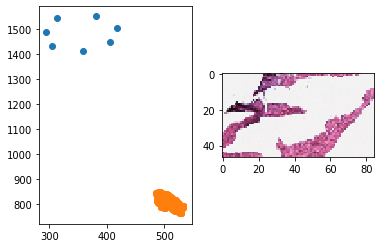

In [18]:
i,j=0,0
plt.subplot(121)
plt.scatter(*(complete_df[k]['Incomplete_Area'][i].T[::-1]).tolist())
plt.scatter(*holes2[k]['PC'][j].T)
plt.subplot(122)
plt.imshow(holes2[k]['imgs'][j])

In [19]:
from torch.utils.data import TensorDataset, DataLoader

In [20]:
from functools import reduce
import operator
imgs=reduce(operator.add,[holes2[k]['imgs'] for k in holes2])

In [21]:
import cv2, torch
from kornia.enhance import Normalize
normalize=Normalize(torch.tensor([0.5,0.5,0.5]),torch.tensor([0.15,0.15,0.15]))
X=normalize(torch.stack([torch.tensor(cv2.resize(x,(256,256))).permute((2,0,1))/255. for x in imgs]))
dataset=TensorDataset(X)

In [22]:
# ! pip install git+https://github.com/PyTorchLightning/pytorch-lightning.git

In [23]:
# from pl_bolts.datamodules.imagenet_datamodule import ImagenetDataModule
# imagenet = ImagenetDataModule('imagenet/')


In [24]:
# ! pip install git+https://github.com/PyTorchLightning/pytorch-lightning-bolts.git

In [25]:
# from pl_bolts.models.self_supervised import CPCV2
# from torchvision.models import resnet18
# load resnet18 pretrained using CPC on imagenet
from pytorchcv.model_provider import get_model

model = get_model('resnet18', pretrained=True)

# model = CPCV2(datamodule=imagenet,encoder='resnet18',encoder_name='resnet18',cpc_encoder='resnet18',pretrained='resnet18')# 
# model.freeze()
# model = model.encoder

# model=resnet18(pretrained=True)

In [26]:
from torch import nn
model.output=nn.Dropout(0)

In [27]:
model=model.cuda()

In [28]:
Z=[]
with torch.no_grad():
    for x in DataLoader(dataset,batch_size=32,shuffle=False,num_workers=8):
        x=x[0].cuda()
#         print(x.shape)
        z = model(x).detach().cpu().numpy()
        Z.append(z)
        del x,z

In [29]:
import umap

In [30]:
np.vstack(Z).shape

(1021, 2048)

In [31]:
embeddings=pd.DataFrame(umap.UMAP(n_components=2).fit_transform(np.vstack(Z)),columns=['x','y'])

In [32]:
import plotly.express as px

In [33]:
# px.scatter(embeddings,x='x',y='y')

In [34]:
PC=reduce(operator.add,[holes2[k]['PC'] for k in holes2])
PC=list(map(lambda x: (x-x.min(0))/(x.max(0)-x.min(0)),PC))

In [43]:
from gtda.homology._utils import _postprocess_diagrams
import dask, dask.diagnostics
from gtda.homology import VietorisRipsPersistence

downsample=0.05
X2=[]
for pc in PC:
    idx=np.random.choice(np.arange(len(pc)),min(5000,int(downsample*len(pc))),replace=False)
#     print(len(pc),len(pc[idx]))
    X2.append(pc[idx])






In [44]:
# plt.hist(list(map(len,X2)))

In [45]:
homology_dimensions = (0, 1)
def fit_persistence(x):
    VR = VietorisRipsPersistence(
        metric='euclidean', homology_dimensions=homology_dimensions, n_jobs=1).fit([x])#
    return VR._ripser_diagram(x)
with dask.diagnostics.ProgressBar():
    diagrams=dask.compute(*[dask.delayed(fit_persistence)(x) for x in X2],scheduler="processes")
diagrams=_postprocess_diagrams(diagrams,(0,1),None,1)

[########################################] | 100% Completed |  1min 52.0s


In [47]:
from gtda.diagrams import PersistenceEntropy

pe=PersistenceEntropy()
pe_vec=pd.DataFrame(pe.fit_transform(diagrams),columns=['x','y'])

In [53]:
emb_cat=pd.DataFrame(umap.UMAP(n_components=2).fit_transform(np.hstack((embeddings.values,pe_vec.values))),columns=['x','y'])

In [54]:
import fire
import matplotlib
matplotlib.rcParams['figure.dpi']=600
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import seaborn as sns, pandas as pd, numpy as np
import matplotlib
import pickle

def plot_umap(zoom=0.05,
              scale=100,
    patch_size=256,
    figsize=(10,10),
    embeddings=embeddings):
    
    t_data=embeddings*scale
    matplotlib.rcParams['figure.dpi']=300
    images=imgs
    def imscatter(x, y, ax, imageData, zoom):
        images = []
        for i in range(len(x)):
            x0, y0 = x[i], y[i]
            img = imageData[i]
            image = OffsetImage(img, zoom=zoom)
            ab = AnnotationBbox(image, (x0, y0), xycoords='data', frameon=False)
            images.append(ax.add_artist(ab))
        ax.update_datalim(np.column_stack([x, y]))
        ax.autoscale()

    fig, ax = plt.subplots(figsize=figsize)
    imscatter(t_data['x'].values, t_data['y'].values, imageData=images, ax=ax, zoom=zoom)
    sns.despine()
    




In [139]:
from gtda.images import Binarizer,SignedDistanceFiltration#,DensityFiltration

In [73]:
from sklearn.pipeline import make_pipeline

In [ ]:
k=0
pipe=make_pipeline(Binarizer(0.8),SignedDistanceFiltration(5))
img_new=np.vstack(np.where(pipe.fit_transform(np.array([cv2.cvtColor(imgs[k],cv2.COLOR_RGB2GRAY)/255.]))[0]<=-2)).T
plt.subplot(121)
plt.scatter(*img_new.T.tolist(),s=1)
plt.subplot(122)
plt.imshow(imgs[k])

In [90]:
img_new.mean()

-3.673588979130256

In [1]:
# plot_umap(zoom=0.2,scale=100,figsize=(25,35))

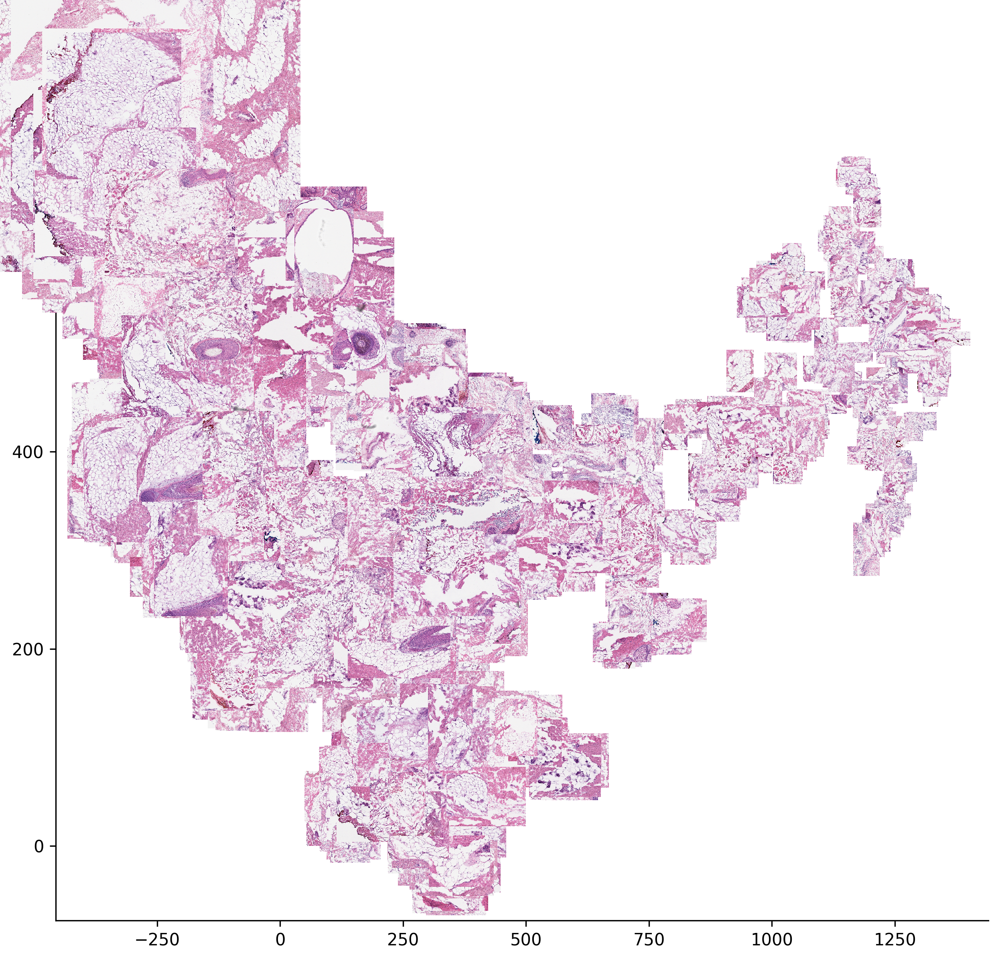

In [55]:
plot_umap(zoom=0.2,scale=100,figsize=(10,10),embeddings=emb_cat)

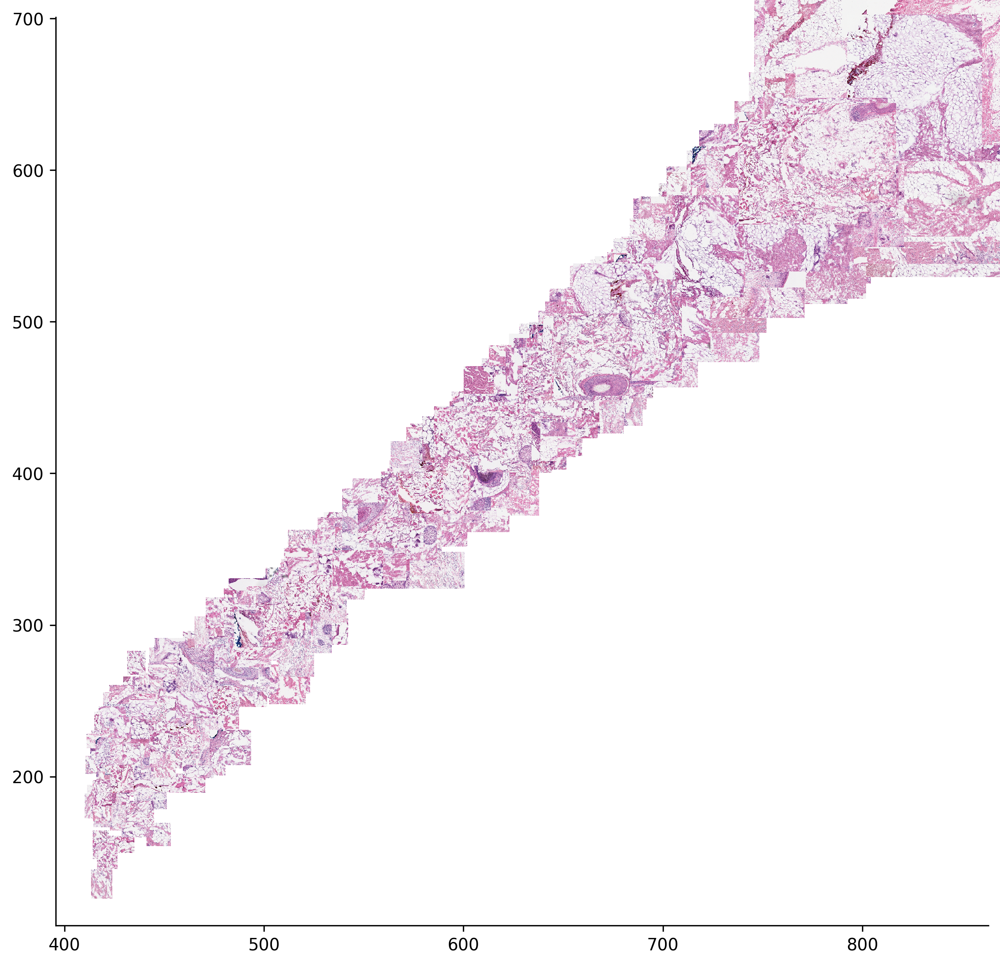

In [50]:
plot_umap(zoom=0.2,scale=100,figsize=(10,10),embeddings=pe_vec)

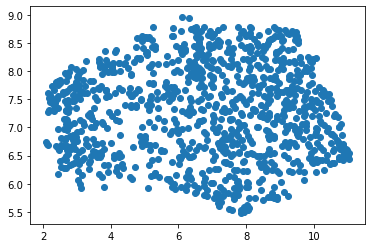

In [48]:
plt.scatter(embeddings['x'],embeddings['y'])

In [ ]:
###################

In [ ]:
downsample=12
compression=2
threshold=230

im1,im2=cv2.resize(skimage.io.imread("../bcc/interactive_test/163_A1a.img.0.png"),None,fx=1./downsample,fy=1./downsample),cv2.resize(skimage.io.imread("../bcc/interactive_test/163_A1b.img.1.png"),None,fx=1./downsample,fy=1./downsample) 




In [3]:
hole_size=2500#8000
mask1=generate_tissue_mask(im1,compression=compression,threshold=threshold, keep_holes=False, max_hole_size=hole_size)

mask2=generate_tissue_mask(im2,compression=compression,threshold=threshold, keep_holes=False, max_hole_size=hole_size)



In [4]:
PC=[x.coords for x in regionprops(scilabel(remove_small_objects(~mask2 & fill_holes(mask2),1500))[0])]#.max()

In [5]:

# pt_clouds=[pt_cloud,pt_cloud2]
downsample=0.05
X2=[]
for pc in PC:
    idx=np.random.choice(np.arange(len(pc)),int(downsample*len(pc)),replace=False)
    X2.append(pc[idx])#-pc[idx].min(0)
    
diagrams=VietorisRipsPersistence().fit_transform(X2)

In [29]:
imgs=[]
for pc in PC:
    xmin,ymin=pc.min(0)
    xmax,ymax=pc.max(0)
    imgs.append(im2[xmin:xmax,ymin:ymax])

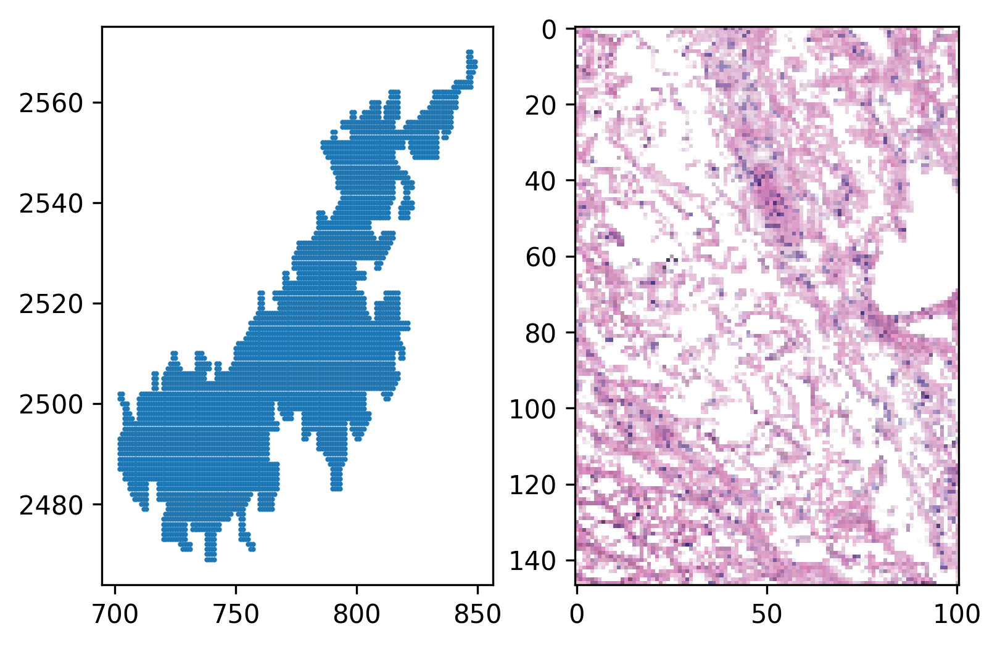

In [8]:
import matplotlib, matplotlib.pyplot as plt
matplotlib.rcParams['figure.dpi']=300
i=9
plot_diagram(diagrams[i])
plt.subplot(121)
plt.scatter(*PC[i].T.tolist(),s=1)
plt.subplot(122)
xmin,ymin=PC[i].min(0)
xmax,ymax=PC[i].max(0)

plt.imshow(im2[xmin:xmax,ymin:ymax])

In [ ]:
# extract topological and image features
# topology from diagram
# image first skimage basic_features vs VAE vs supervised

In [1]:
from skimage.feature import multiscale_basic_features

In [7]:
from gtda.diagrams import PersistenceEntropy
PE = PersistenceEntropy()
features = PE.fit_transform(diagrams)

In [30]:
ft=multiscale_basic_features(imgs[2],multichannel=True)

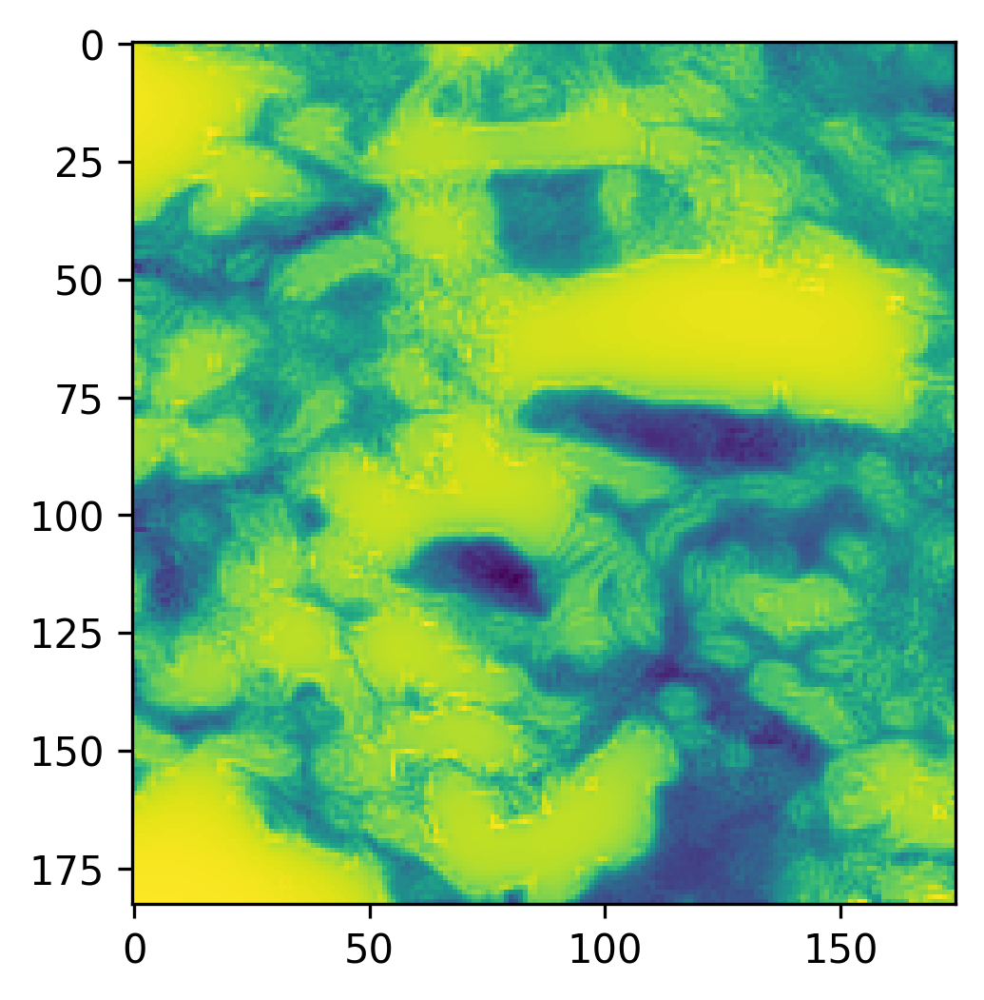

In [36]:
plt.imshow(ft[...].mean(-1))#ft.shape

In [15]:
ft.shape

(147, 101, 3, 30)

In [10]:
import skimage
skimage.__version__

'0.17.2'

In [3]:
# ! pip install git+https://github.com/scikit-image/scikit-image.git

In [ ]:
# ft=multiscale_basic_features(im1[xmin:xmax,ymin:ymax])